# Load Libraries

In [10]:
import numpy as np
import pickle
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from matplotlib.pyplot import figure
from PIL import Image
import requests
from io import BytesIO
import seaborn as sns

# Load Data

### SVD Ratings

In [11]:
file = open('ratings_svd_100_comp.pkl', 'rb')
approx_ratings = pickle.load(file)
file.close()

In [12]:
svd_ratings_df = pd.DataFrame(approx_ratings)

### Ratings with Nan

In [13]:
file = open('ratings_nan.pkl', 'rb')
rating_matrix_with_nan = pickle.load(file)
file.close()

### User Mapping

In [14]:
file = open('user_mapping.pkl', 'rb')
user_mapping = pickle.load(file)
file.close()

### Product Mapping

In [15]:
file = open('product_mapping.pkl', 'rb')
product_mapping = pickle.load(file)
file.close()

### Reverse User Mapping

In [16]:
file = open('reverse_user_mapping.pkl', 'rb')
reverse_user_mapping = pickle.load(file)
file.close()

### Reverse Product Mapping

In [17]:
file = open('reverse_product_mapping.pkl', 'rb')
reverse_product_mapping = pickle.load(file)
file.close()

### All products

In [18]:
products_df = pd.read_csv('products.csv')

### All reviews

In [19]:
reviews_df = pd.read_csv('reviews.csv')

### User Attributes-based cosine similarity

In [20]:
file = open('temp_user_data.pkl', 'rb')
temp_data = pickle.load(file)
file.close()

In [21]:
file = open('cosine_sims.pkl', 'rb')
sim_mat = pickle.load(file)
file.close()

In [22]:
sim_df = pd.DataFrame(sim_mat, index = temp_data.index, columns = temp_data.index)

### Products cosine similarity

In [23]:
file = open('cs_matrix_products.pkl', 'rb')
cs_matrix_products = pickle.load(file)
file.close()

# Helper Functions

### Print Images

In [32]:
def print_images(df, text_to_write):
  if df.shape[0] > 5:
    df = df.iloc[:5,:]

  product_img_link = df['product_img_link'].values
  displayName = df['displayName'].values
  product = df['product_id'].values

  n = len(product_img_link)
  if n > 1:
    fig, axs = plt.subplots(1, n, figsize=(n*4, 5))
    i = 0
    for link, display_name, id_ in zip(product_img_link, displayName, product):
      if type(link) == str:
          response = requests.get(link)
          img = Image.open(BytesIO(response.content))
          axs[i].imshow(np.asarray(img))
          axs[i].set_title(str(text_to_write) + str(i+1) + ': ' + str(id_) + '\n' + str(display_name))
          # axs[i].axis('off')

      else:
        link = 'https://www.wildhareboca.com/wp-content/uploads/sites/310/2018/03/image-not-available-200x300.jpg'
        response = requests.get(link)
        img = Image.open(BytesIO(response.content))
        axs[i].imshow(np.asarray(img))
        axs[i].set_title(id_)
        # axs[i].axis('off')
      i+=1
    plt.show()

  else:
    fig, axs = plt.subplots(1, n, figsize=(n*4, 5))
    i = 0
    for link, display_name, id_ in zip(product_img_link, displayName, product):
      if type(link) == str:
          response = requests.get(link)
          img = Image.open(BytesIO(response.content))
          axs.imshow(np.asarray(img))
          axs.set_title(str(text_to_write) + str(i+1) + ': ' + str(id_) + '\n' + str(display_name))
          # axs[i].axis('off')

      else:
        link = 'https://www.wildhareboca.com/wp-content/uploads/sites/310/2018/03/image-not-available-200x300.jpg'
        response = requests.get(link)
        img = Image.open(BytesIO(response.content))
        axs.imshow(np.asarray(img))
        axs.set_title(id_)
        # axs[i].axis('off')
      i+=1
    plt.show()

### Get products subset based on product_id

In [25]:
def get_recommended_products(product_list):
    sub_products_df = pd.DataFrame(columns=products_df.columns)
    for p in product_list:
        new_product = products_df.loc[products_df['product_id'] == p]
        sub_products_df = pd.concat([sub_products_df, new_product])
    return sub_products_df

### Map user_id to svd user_index

In [26]:
def get_user_mapping(user_id):
    return user_mapping[user_id]

### Reverse map svd user_index and product_index for actual user_id and product_id 

In [27]:
def reverse_user_and_product(user_embed, product_embed):
    return reverse_user_mapping[user_embed], reverse_product_mapping[product_embed]

# Input User

In [81]:
u_id = 22091421
user_idx = get_user_mapping(u_id)

# User History

In [50]:
def get_products_purchased_list(user_id):
    user_records = reviews_df.loc[reviews_df['user_id'] == user_id]
    user_records = user_records.drop_duplicates('product_id').copy()
    products_bought = user_records['product_id'].to_list()

    return products_bought

In [82]:
products_bought = get_products_purchased_list(u_id)
products_bought_df = products_df.loc[products_df['product_id'].isin(products_bought)]

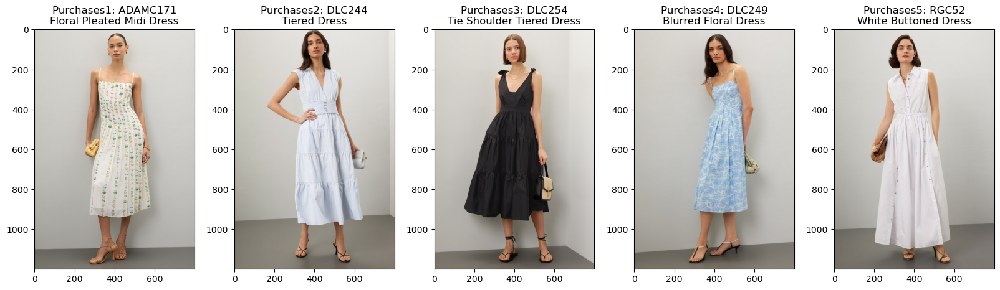

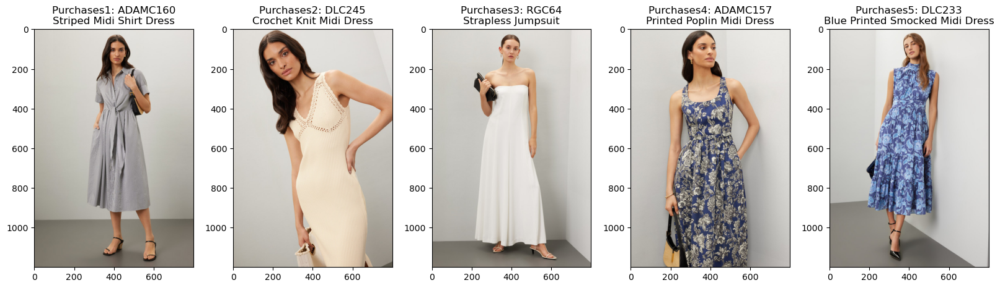

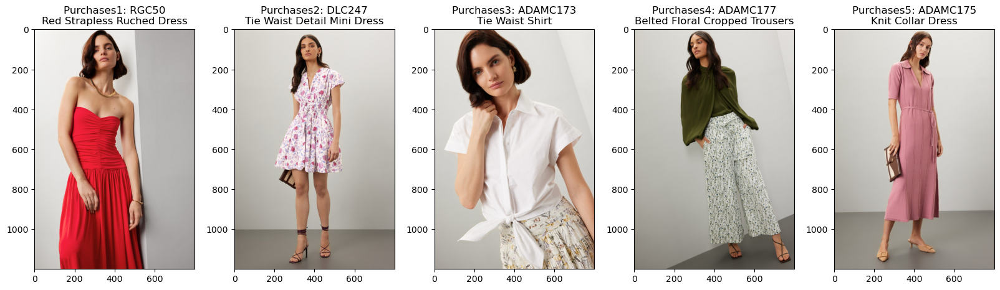

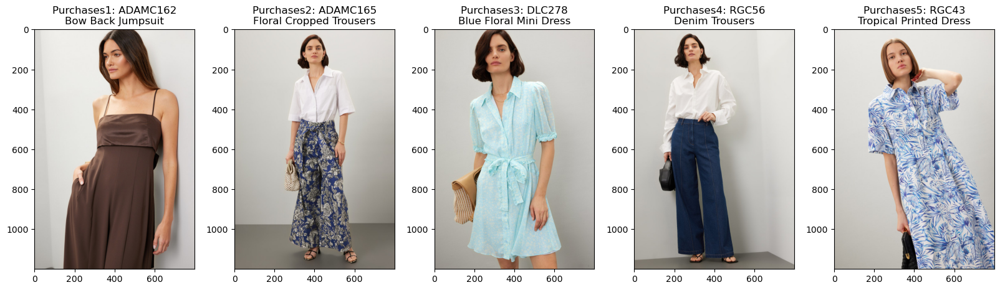

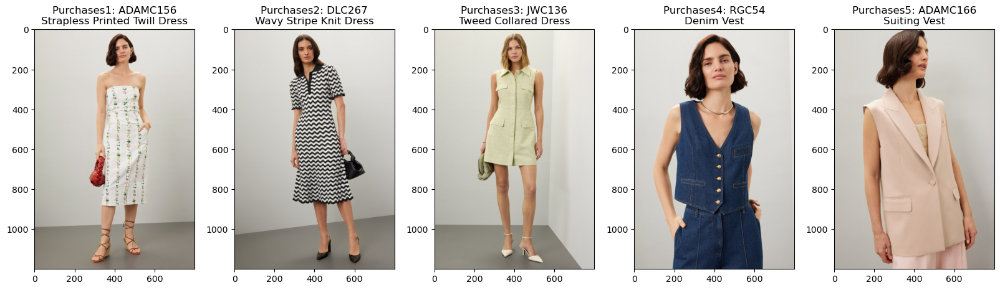

...

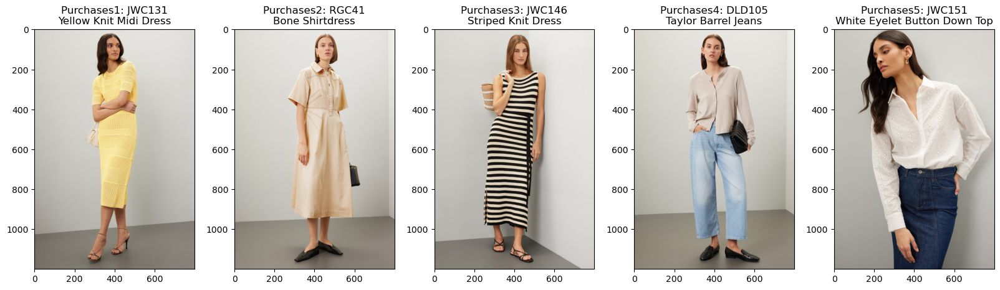

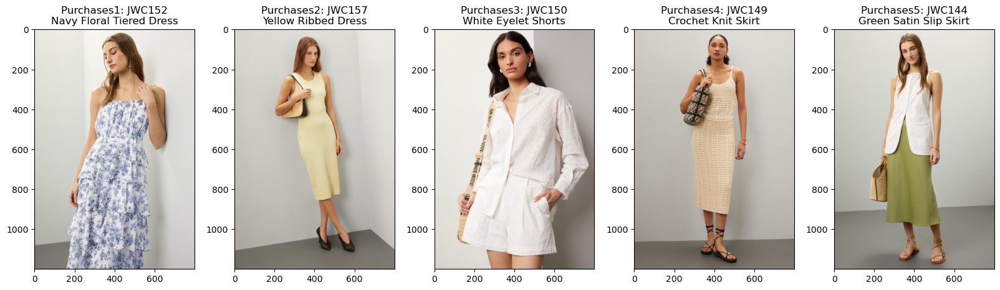

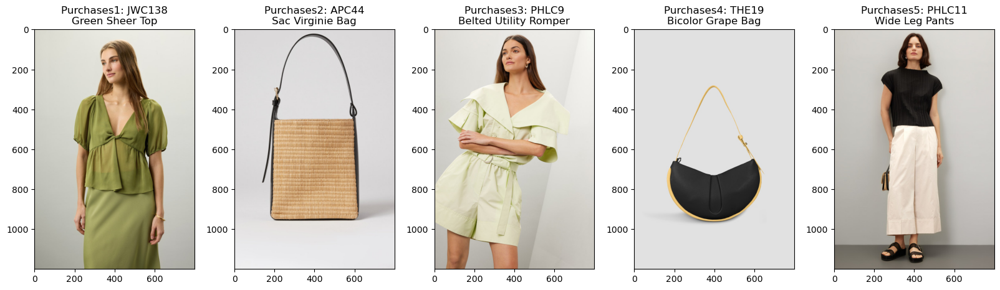

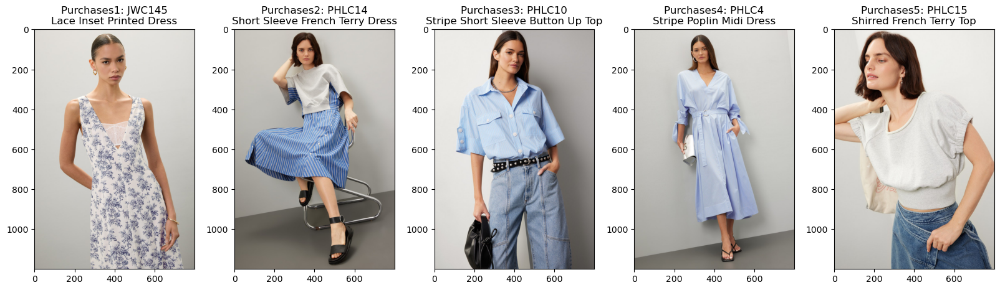

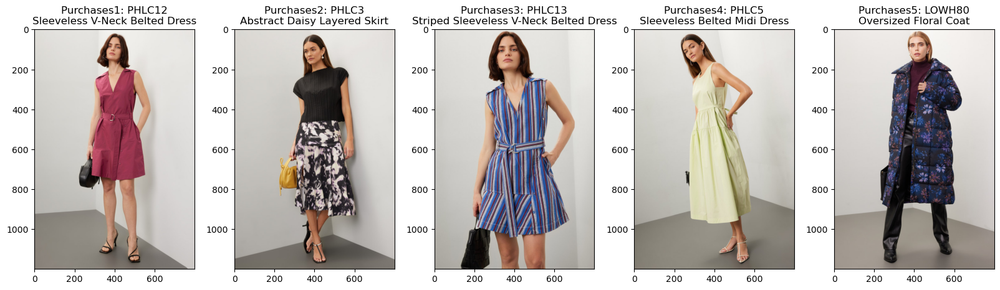

In [83]:
for i in range(0,len(products_bought_df),5):
    print_images(products_bought_df.iloc[i:i+5,:], 'Purchases')

# Rating-based Collaborative Filtering

### Get top 'n' items based on svd ratings

In [38]:
def recom_product(user_id = 0, n_items = 5):
    indices = []
    user_df = rating_matrix_with_nan.iloc[user_id].copy()
    est_ratings = svd_ratings_df[user_id].copy()

    for product in rating_matrix_with_nan.columns:
        if pd.notnull(user_df.loc[product]):
            est_ratings.loc[product] = 0
    
    for i in range(n_items):
        unrated_max = est_ratings.argmax()
        indices.append(unrated_max)
        est_ratings.loc[unrated_max] = 0

    return indices

### Driver

In [84]:
recom_products = []

product_idxs = recom_product(user_idx)

for pr in product_idxs:
    _, pr_id = reverse_user_and_product(user_idx, pr)
    recom_products.append(pr_id)

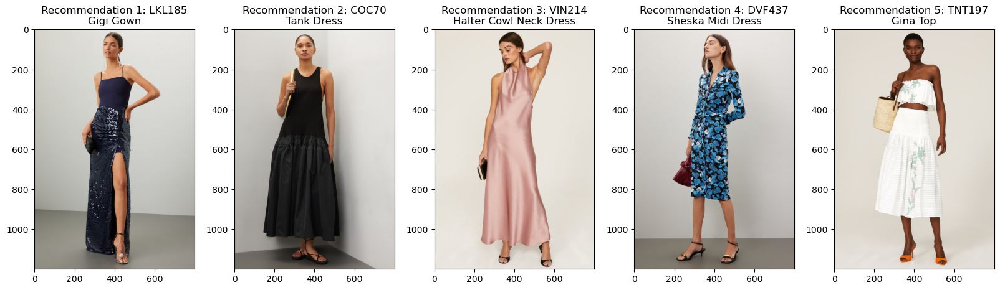

In [85]:
recom_df = get_recommended_products(recom_products)
print_images(recom_df, 'Recommendation ')

# Similar user attributes-based recommendation

### Get most similar users

In [90]:
def get_similar_users(user_idx, n_users = 5):
    sim_users = []

    sub_df = sim_df.iloc[user_idx,:].copy()
    sub_df.iloc[user_idx] = 0

    for i in range(n_users):
        sim_user, arg = sub_df.idxmax(), sub_df.argmax()
        sim_users.append(sim_user)
        sub_df.iloc[arg] = 0

    return sim_users

### Sort products by svd ratings

In [91]:
def sort_products(prods, prod_ratings):
    new_recom_df = pd.DataFrame()
    new_recom_df['product_id'] = prods
    new_recom_df['product_id'] = new_recom_df['product_id'].map(reverse_product_mapping)
    new_recom_df['pred_ratings'] = prod_ratings
    new_recom_df = new_recom_df.sort_values(by = 'pred_ratings', ascending=False)
    new_recom_df = new_recom_df.loc[new_recom_df['pred_ratings'] > 0]
    return new_recom_df

### Get products from similar users

In [92]:
def get_sim_products(sim_users_list, user_idx):
    prods = []
    for u in sim_users_list:
        sim_user_idx = get_user_mapping(u)
        p_for_user = rating_matrix_with_nan.loc[sim_user_idx]
        p_for_user = p_for_user.loc[p_for_user.isnull() == False]
        for p in p_for_user.index:
            prods.append(p)

    prod_ratings = []
    user_approx_ratings = approx_ratings[user_idx,:]
    for p in prods:
        prod_ratings.append(user_approx_ratings[p])

    recom_df = sort_products(prods, prod_ratings)
    
    return recom_df

### Get top n product ids

In [93]:
def get_top_products(top_recs_df, n_items = 5):
    if n_items > len(top_recs_df):
        n_items = len(top_recs_df)

    top_n_recs = top_recs_df.iloc[:n_items,0].values
    return top_n_recs

### Driver

In [111]:
sim_users = get_similar_users(user_idx)

In [112]:
sim_products_df = get_sim_products(sim_users, user_idx)

In [113]:
top_products = get_top_products(sim_products_df)

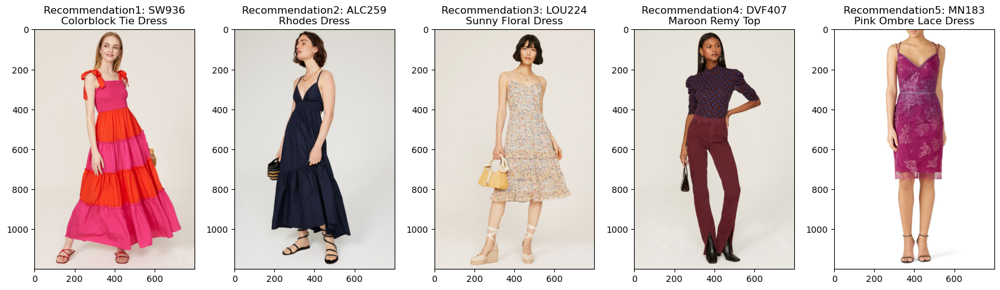

In [114]:
recom_df = get_recommended_products(top_products)
print_images(recom_df, 'Recommendation')

# Products similar to those owned by user

### Get top similar products

In [98]:
def get_top_similar_products(product_id):
    n_products = 5
    top_5 = cs_matrix_products[[product_id]].sort_values(ascending = False, by = product_id)[0:n_products+1]
    top_5_links = top_5.merge(products_df[['product_id','product_img_link', 'displayName', 'designer_name']], on = 'product_id')
    top_5_links.rename(columns = {top_5_links.columns[1]:'similarity'}, inplace = True)
    return top_5_links.iloc[0,:],top_5_links.iloc[1:,:]

### Check if already purchased

In [99]:
def check_purchase(sim_products_df, user_id):
    user_purchases = reviews_df.loc[reviews_df['user_id'] == user_id].copy()
    purchased_products_list = user_purchases.drop_duplicates('product_id')['product_id'].to_list()
    products_not_purchased = sim_products_df.loc[~sim_products_df['product_id'].isin(purchased_products_list)]
    return products_not_purchased

### Get similar products ratings

In [100]:
def get_prod_ratings(products_list, user_idx):
    prod_ratings = []
    prods = []
    user_approx_ratings = approx_ratings[user_idx,:]
    for p in products_list:
        p_mapped = product_mapping[p]
        prods.append(p_mapped)
        prod_ratings.append(user_approx_ratings[p_mapped])

    recom_df = sort_products(prods, prod_ratings)
    return recom_df

### Get recommended products - user owned content-based

In [101]:
def get_recommended_products_owned(sim_products_df):
    product_list = sim_products_df['product_id'].to_list()
    sub_products_df = pd.DataFrame()
    for p in product_list:
        new_product = products_df.loc[products_df['product_id'] == p].copy()
        new_product = new_product.merge(sim_products_df[['product_id', 'product_owned']], on = 'product_id')
        sub_products_df = pd.concat([sub_products_df, new_product])
    return sub_products_df

### Get product name

In [102]:
def get_prod_name(prod_id):
    return products_df.loc[products_df['product_id'] == prod_id]['displayName'].values[0]

### Get owned product ratings

In [103]:
def get_owned_product_ratings(prod_df, u_id):
    owned_ratings_dict = {}
    user_df = reviews_df.loc[reviews_df['user_id'] == u_id]
    products_list = prod_df['product_owned'].unique()

    for p in products_list:
        # print(p)
        owned_ratings_dict[p] = user_df.loc[user_df['product_id'] == p]['rating'].values[0]

    return owned_ratings_dict

### Print Images - content-based

In [104]:
def print_images_content(df, text_to_write):
  if df.shape[0] > 5:
    df = df.iloc[:5,:]

  product_img_link = df['product_img_link'].values
  displayName = df['displayName'].values
  product = df['product_id'].values

  similar_product = []
  for p_id in df['product_owned'].values:
    similar_product.append(get_prod_name(p_id))

  n = len(product_img_link)
  if n > 1:
    fig, axs = plt.subplots(1, n, figsize=(n*4, 5))
    i = 0
    for link, display_name, id_, owned_prod_name in zip(product_img_link, displayName, product, similar_product):
      if type(link) == str:
          response = requests.get(link)
          img = Image.open(BytesIO(response.content))
          axs[i].imshow(np.asarray(img))
          axs[i].set_title(str(text_to_write) + str(i+1) + ': ' + str(id_) + '\n' + str(display_name) + '\nSimilar to:' + str(owned_prod_name))
          # axs[i].axis('off')

      else:
        link = 'https://www.wildhareboca.com/wp-content/uploads/sites/310/2018/03/image-not-available-200x300.jpg'
        response = requests.get(link)
        img = Image.open(BytesIO(response.content))
        axs[i].imshow(np.asarray(img))
        axs[i].set_title(id_)
        # axs[i].axis('off')
      i+=1
    plt.show()

  else:
    fig, axs = plt.subplots(1, n, figsize=(n*4, 5))
    i = 0
    for link, display_name, id_, owned_prod_name in zip(product_img_link, displayName, product, similar_product):
      if type(link) == str:
          response = requests.get(link)
          img = Image.open(BytesIO(response.content))
          axs.imshow(np.asarray(img))
          axs.set_title(str(text_to_write) + str(i+1) + ': ' + str(id_) + '\n' + str(display_name) + '\nSimilar to:' + str(owned_prod_name))
          # axs[i].axis('off')

      else:
        link = 'https://www.wildhareboca.com/wp-content/uploads/sites/310/2018/03/image-not-available-200x300.jpg'
        response = requests.get(link)
        img = Image.open(BytesIO(response.content))
        axs.imshow(np.asarray(img))
        axs.set_title(id_)
        # axs[i].axis('off')
      i+=1
    plt.show()

### Driver

In [105]:
products_bought = get_products_purchased_list(u_id)

In [106]:
top_similar_products = pd.DataFrame()

for p in products_bought:
    product_link, top_5_links = get_top_similar_products(p)
    top_5_links['product_owned'] = p
    top_similar_products = pd.concat([top_similar_products, top_5_links])

top_similar_products.drop_duplicates('product_id', inplace = True)

In [107]:
top_similar_products = check_purchase(top_similar_products, u_id)

In [108]:
ratings_dict = get_owned_product_ratings(top_similar_products, u_id)

In [109]:
top_similar_products['owned_rating'] = top_similar_products['product_owned'].map(ratings_dict)
top_similar_products['sum'] = top_similar_products['owned_rating'] + top_similar_products['similarity']
top_similar_products.sort_values(by = 'sum', inplace = True, ascending = False)
top_similar_products.drop_duplicates('product_owned', inplace = True) # remove to allow multiple occurences of owned product

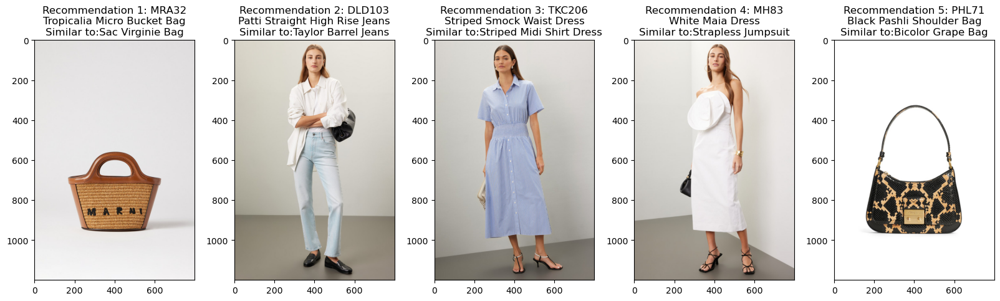

In [110]:
recom_df = get_recommended_products_owned(top_similar_products)
print_images_content(recom_df, 'Recommendation ')

# Products similar to viewed product

### Get recommended products

In [261]:
def get_recommended_products(sim_products_df):
    product_list = sim_products_df['product_id'].to_list()
    sub_products_df = pd.DataFrame(columns=products_df.columns)
    for p in product_list:
        new_product = products_df.loc[products_df['product_id'] == p].copy()
        sub_products_df = pd.concat([sub_products_df, new_product])
    return sub_products_df

### Driver

In [268]:
p_id = 'DK13'

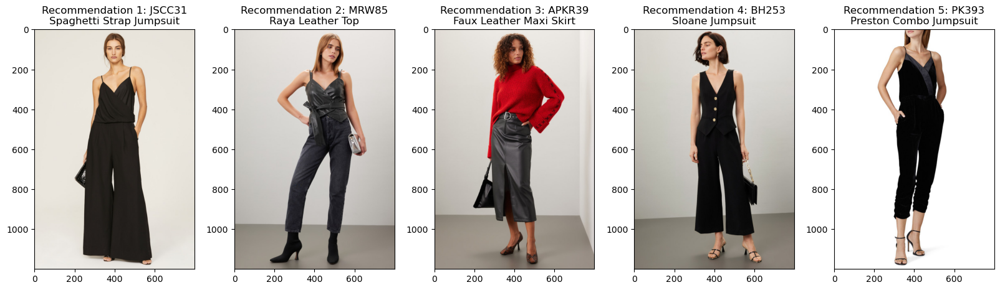

In [269]:
_,top_similar_products = get_top_similar_products(p_id)
recom_df = get_recommended_products(top_similar_products)
print_images(recom_df, 'Recommendation ')